In [62]:
import matplotlib.pyplot as plt
from scipy.io import wavfile as wav
import numpy as np
%matplotlib inline

In [4]:
FILE = 'data/Intro.mp3'

In [6]:
# This file is part of audioread.
# Copyright 2011, Adrian Sampson.
#
# Permission is hereby granted, free of charge, to any person obtaining
# a copy of this software and associated documentation files (the
# "Software"), to deal in the Software without restriction, including
# without limitation the rights to use, copy, modify, merge, publish,
# distribute, sublicense, and/or sell copies of the Software, and to
# permit persons to whom the Software is furnished to do so, subject to
# the following conditions:
# 
# The above copyright notice and this permission notice shall be
# included in all copies or substantial portions of the Software.

"""Command-line tool to decode audio files to WAV files."""
from __future__ import print_function
import audioread
import sys
import os
import wave
import contextlib

def decode(filename):
    filename = os.path.abspath(os.path.expanduser(filename))
    if not os.path.exists(filename):
        print("File not found.", file=sys.stderr)
        sys.exit(1)

    try:
        with audioread.audio_open(filename) as f:
            print('Input file: %i channels at %i Hz; %.1f seconds.' % \
                  (f.channels, f.samplerate, f.duration),
                  file=sys.stderr)
            print('Backend:', str(type(f).__module__).split('.')[1],
                  file=sys.stderr)

            with contextlib.closing(wave.open(filename + '.wav', 'w')) as of:
                of.setnchannels(f.channels)
                of.setframerate(f.samplerate)
                of.setsampwidth(2)

                for buf in f:
                    of.writeframes(buf)

    except audioread.DecodeError:
        print("File could not be decoded.", file=sys.stderr)

In [7]:
decode(FILE)

Input file: 2 channels at 44100 Hz; 44.0 seconds.
Backend: macca


In [8]:
WAV_FILE = FILE + '.wav'

In [23]:
rate, data = wav.read(WAV_FILE)

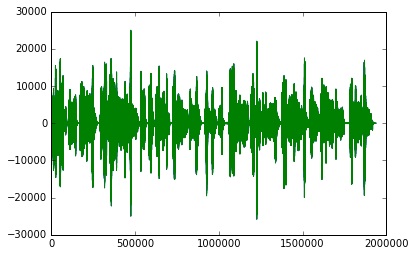

In [24]:
plt.plot(data)
plt.show()

In [25]:
data.shape

(1938816, 2)

In [26]:
rate

44100

In [27]:
import IPython
IPython.display.Audio(WAV_FILE)

In [28]:
# Generate a sound
import numpy as np
framerate = 44100
t = np.linspace(0,5,framerate*5)
data2 = np.sin(2*np.pi*220*t) + np.sin(2*np.pi*224*t)
IPython.display.Audio(data2,rate=framerate)

In [50]:
for row in range(20000, 22000):
    # print(data[row, :])
# IPython.display.Audio(data = data3, rate=framerate)

IndentationError: expected an indented block (<ipython-input-50-b5d0d8e32fa3>, line 3)

In [49]:
IPython.display.Audio(data[0:64000, 0], rate=framerate)

In [52]:
IPython.display.Audio(data[0:framerate*4, 0], rate=framerate)

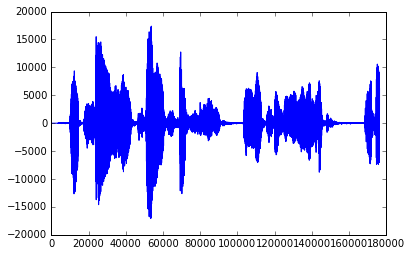

In [54]:
plt.plot(data[0:framerate*4, 0])
plt.show()

In [56]:
text = "Let's say you're a college freshman and you're choosing a major. You're"
words = text.split()
print("%d WORDS" % len(words))

12 WORDS


In [146]:
ac = data[0:framerate*4, 0]
print('Median: %f' % np.median(ac))
threshold = .3
print('Threshold: %f' % (threshold) )
markers = []
ON = False
for i in range(100, ac.shape[0] - 100, framerate//30):
    vals = np.mean(np.abs((ac[i-50:i+50] - np.mean(ac))/ np.std(ac)))
    if vals > threshold:
        if not ON:
            markers.append([i, ac[i] ])
            ON = True
    else:
        ON = False
print(markers)

Median: 0.000000
Threshold: 0.300000
[[10390, 2551], [19210, -992], [48610, 1365], [51550, 889], [64780, -949], [69190, 1110], [80950, -1146], [85360, -302], [88300, -949], [104470, 1152], [120640, -5200], [125050, -242], [169150, 81], [175030, -106]]


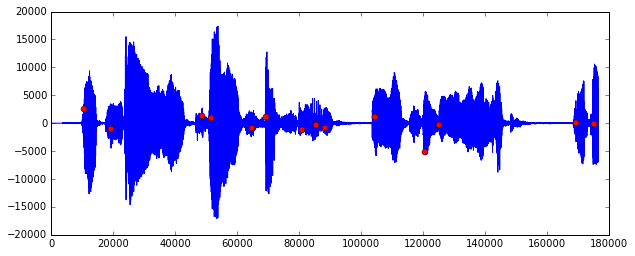

In [147]:
x, y = zip(*markers)
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
ax.plot(ac)
ax.plot(x,y, 'ro')
fig.show()

In [120]:
IPython.display.Audio(ac[11120-1000:18834-1000], rate=framerate)

In [121]:
IPython.display.Audio(ac[19210-1000:48610], rate=framerate)

In [148]:
IPython.display.Audio(ac[125050:169150], rate=framerate)

In [59]:
rate, zdata = wav.read('data/Zach2.wav')

In [60]:
IPython.display.Audio(zdata[framerate*0:framerate*4, 0], rate=framerate)

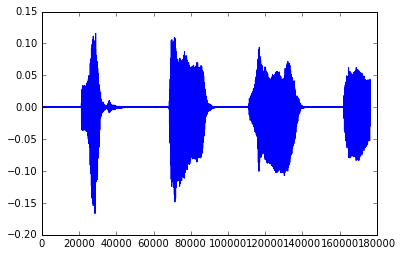

In [61]:
plt.plot(zdata[0:framerate*4, 0])
plt.show()

In [132]:
text = "Let's say you're a"
audioChunk = zdata[0:framerate*4.5, 0]
print('Median: %f' % np.median(audioChunk))
threshold = .3 # 61% for cumulative z values
print('Threshold: %f' % (threshold) )
markers = []
ON = False
for i in range(100, audioChunk.shape[0] - 100, framerate//50):
    vals = np.mean(np.abs((audioChunk[i-100:i+100] - np.mean(audioChunk))/ np.std(audioChunk)))
    if vals > threshold:
        if not ON:
            markers.append([i, audioChunk[i] ])
            ON = True
    else:
        ON = False
print(markers)

Median: 0.000011
Threshold: 0.300000
[[21268, -0.018286552], [68896, 0.043553524], [112114, -0.011792274], [162388, 0.011323638]]


/Library/Python/2.7/site-packages/ipykernel/__main__.py:2: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


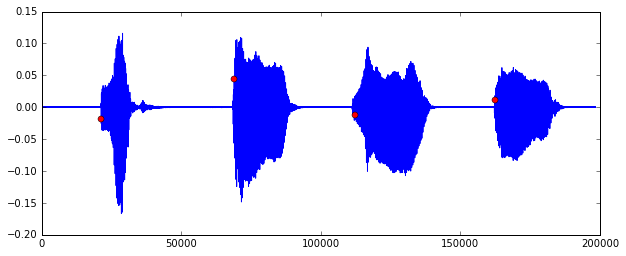

In [133]:
x, y = zip(*markers)
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
ax.plot(audioChunk)
ax.plot(x,y, 'ro')
fig.show()

In [134]:
text = "Let's say you're a"
audioChunk = zdata[0:framerate*4.5, 0]
print('Median: %f' % np.median(audioChunk))
threshold = np.mean(audioChunk) + .3 * np.std(audioChunk)
print('Threshold: %f' % (threshold) )
markers = []
ON = False
for i in range(100, audioChunk.shape[0] - 100, framerate//40):
    vals = np.mean(np.abs(audioChunk[i-100:i+100]))
    if vals > threshold:
        if not ON:
            markers.append([i, audioChunk[i] ])
            ON = True
    else:
        ON = False
print(markers)

Median: 0.000011
Threshold: 0.006349
[[22140, 0.0023543711], [69526, 0.090782695], [111402, -0.0097981365], [163196, -0.010089604]]


/Library/Python/2.7/site-packages/ipykernel/__main__.py:2: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


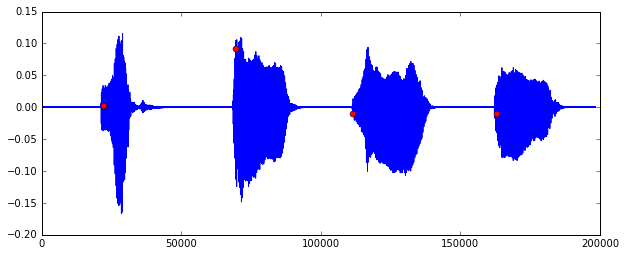

In [135]:
x, y = zip(*markers)
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
ax.plot(audioChunk)
ax.plot(x,y, 'ro')
fig.show()

In [115]:
IPython.display.Audio(audioChunk[22140-10000:69526-10000], rate=framerate)

In [116]:
IPython.display.Audio(audioChunk[69526-10000:112504-10000], rate=framerate)

In [117]:
IPython.display.Audio(audioChunk[112504-10000: 163196-10000], rate=framerate)

In [118]:
IPython.display.Audio(audioChunk[163196-10000: ], rate=framerate)